In [1]:
#importando bibliotecas
import os
import base64
import requests
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, silhouette_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import OPTICS

#grafico
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
# Lendo os arquivos
#df_docente = pd.read_csv("DM_DOCENTE.CSV", sep="|")
#df_aluno = pd.read_csv("DM_ALUNO.CSV", sep="|")
#df_variaveis = pd.read_excel("Dicionário de Variáveis.xls", "DM_ALUNO")
#df_codigo = pd.read_excel("Código_do_País_de_Nascimento_ou_Naturalização.xlsx")
#df_disciplinas = pd.read_csv("dados_disciplinas.txt", sep=",")

In [3]:
Linhas = 5000

reader = pd.read_csv(r"C:\Users\talle\OneDrive\Área de Trabalho\Talles\Reconhecimento-de-Padroes\DM_ALUNO.CSV", sep='|', low_memory=False )
chunk = reader     # agora é um DataFrame

In [4]:
# Transforma variáveis objetos em numeros

le = LabelEncoder()

chunk["CO_CINE_ROTULO"] = le.fit_transform(chunk["CO_CINE_ROTULO"])
chunk["ID_ALUNO"] = le.fit_transform(chunk["ID_ALUNO"])
chunk["DT_INGRESSO_CURSO"] = le.fit_transform(chunk["DT_INGRESSO_CURSO"])

In [5]:
essenciais = ['NU_IDADE', 'TP_SEXO', 'TP_SITUACAO']
df_inicial = len(chunk)
for col in essenciais:
    if col in chunk.columns:
        chunk = chunk[chunk[col].notna()]

df = chunk


In [6]:
mappings = {
    'TP_SEXO': {1: 'Feminino', 2: 'Masculino'},
    'TP_COR_RACA': {1: 'Branca', 2: 'Preta', 3: 'Parda', 4: 'Amarela', 5: 'Indígena', 0: 'Não informado'},
    'TP_SITUACAO': {2: 'Cursando', 3: 'Trancado', 4: 'Desvinculado', 5: 'Transferido', 6: 'Formado', 7: 'Falecido'},
    'TP_TURNO': {1: 'Matutino', 2: 'Vespertino', 3: 'Noturno', 4: 'Integral'},
    'TP_CATEGORIA_ADMINISTRATIVA': {1: 'Pública Federal', 2: 'Pública Estadual', 3: 'Pública Municipal', 
                                    4: 'Privada com fins lucrativos', 5: 'Privada sem fins lucrativos', 
                                    7: 'Especial', 8: 'Privada - Particular em sentido estrito', 
                                    9: 'Privada - Comunitária'}
}

for coluna, mapping in mappings.items():
    if coluna in df.columns:
        df[coluna + '_DESC'] = df[coluna].map(mapping).fillna('Não informado')

In [7]:
if 'NU_ANO_INGRESSO' in df.columns and 'NU_IDADE' in df.columns:
    df['IDADE_INGRESSO'] = df['NU_IDADE'] - (2018 - df['NU_ANO_INGRESSO'])
    df['IDADE_INGRESSO'] = df['IDADE_INGRESSO'].clip(lower=15, upper=70)  # Limites razoáveis

if 'NU_IDADE' in df.columns:
    df['FAIXA_ETARIA'] = pd.cut(df['NU_IDADE'], 
                                bins=[0, 20, 25, 30, 40, 100], 
                                labels=['<=20', '21-25', '26-30', '31-40', '>40'])
    
if 'NU_ANO_INGRESSO' in df.columns:
    df['TEMPO_CURSO'] = 2018 - df['NU_ANO_INGRESSO']
    df['TEMPO_CURSO'] = df['TEMPO_CURSO'].clip(lower=0, upper=15)  # Máximo 15 anos faz sentido

if 'IN_CONCLUINTE' in df.columns:
        df['CONCLUIU'] = df['IN_CONCLUINTE'].fillna(0)
elif 'TP_SITUACAO' in df.columns:
        df['CONCLUIU'] = (df['TP_SITUACAO'] == 6).astype(int)

In [8]:
# Idades razoáveis
if 'NU_IDADE' in df.columns:
    df = df[(df['NU_IDADE'] >= 15) & (df['NU_IDADE'] <= 100)]

# Anos de ingresso válidos
if 'NU_ANO_INGRESSO' in df.columns:
    df = df[(df['NU_ANO_INGRESSO'] >= 1990) & (df['NU_ANO_INGRESSO'] <= 2018)]

In [9]:
# Estatísticas básicas
if 'NU_IDADE' in df.columns:
    print(f"   Idade: {df['NU_IDADE'].min()}-{df['NU_IDADE'].max()} anos (média: {df['NU_IDADE'].mean():.1f})")

if 'TP_SEXO_DESC' in df.columns:
    dist_sexo = df['TP_SEXO_DESC'].value_counts()
    print(f"   Sexo: {dist_sexo.to_dict()}")


   Idade: 15-95 anos (média: 27.7)
   Sexo: {'Feminino': 6712763, 'Masculino': 5331113}


In [10]:
# Estatísticas descritivas
print("\nESTATÍSTICAS DESCRITIVAS:")
if 'NU_IDADE' in df.columns:
    print(f"Idade: {df['NU_IDADE'].mean():.1f} ± {df['NU_IDADE'].std():.1f} anos")
    print(f"Faixa: {df['NU_IDADE'].min()}-{df['NU_IDADE'].max()} anos")

if 'TEMPO_CURSO' in df.columns:
    print(f"Tempo no curso: {df['TEMPO_CURSO'].mean():.1f} ± {df['TEMPO_CURSO'].std():.1f} anos")

# Distribuições principais
print("\nDISTRIBUIÇÕES:")
for col in ['TP_SEXO_DESC', 'TP_SITUACAO_DESC', 'FAIXA_ETARIA']:
    if col in df.columns:
        dist = df[col].value_counts()
        print(f"\n{col}:")
        for categoria, count in dist.head(5).items():
            pct = (count/len(df))*100
            print(f"  {categoria}: {count} ({pct:.1f}%)")


ESTATÍSTICAS DESCRITIVAS:
Idade: 27.7 ± 8.6 anos
Faixa: 15-95 anos
Tempo no curso: 1.9 ± 2.0 anos

DISTRIBUIÇÕES:

TP_SEXO_DESC:
  Feminino: 6712763 (55.7%)
  Masculino: 5331113 (44.3%)

TP_SITUACAO_DESC:
  Cursando: 7186937 (59.7%)
  Desvinculado: 2193156 (18.2%)
  Trancado: 1290387 (10.7%)
  Formado: 1264770 (10.5%)
  Transferido: 107434 (0.9%)

FAIXA_ETARIA:
  21-25: 4265483 (35.4%)
  31-40: 2372497 (19.7%)
  26-30: 2150805 (17.9%)
  <=20: 2127758 (17.7%)
  >40: 1127333 (9.4%)


In [11]:
# Configurar subplot
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=['Distribuição de Idade', 'Situação no Curso', 
                    'Sexo por Faixa Etária', 'Evolução Temporal'],
    specs=[[{"secondary_y": False}, {"secondary_y": False}],
            [{"secondary_y": False}, {"secondary_y": False}]]
)

# 1. Histograma de idade
if 'NU_IDADE' in df.columns:
    fig.add_trace(
        go.Histogram(x=df['NU_IDADE'], name='Idade', showlegend=False),
        row=1, col=1
    )

# 2. Situação no curso
if 'TP_SITUACAO_DESC' in df.columns:
    situacao_counts = df['TP_SITUACAO_DESC'].value_counts()
    fig.add_trace(
        go.Bar(x=situacao_counts.index, y=situacao_counts.values, 
                name='Situação', showlegend=False),
        row=1, col=2
    )

# 3. Sexo por faixa etária
if 'TP_SEXO_DESC' in df.columns and 'FAIXA_ETARIA' in df.columns:
    crosstab = pd.crosstab(df['FAIXA_ETARIA'], df['TP_SEXO_DESC'])
    for sexo in crosstab.columns:
        fig.add_trace(
            go.Bar(x=crosstab.index, y=crosstab[sexo], name=sexo),
            row=2, col=1
        )

# 4. Evolução temporal
if 'NU_ANO_INGRESSO' in df.columns:
    ingressos = df['NU_ANO_INGRESSO'].value_counts().sort_index()
    fig.add_trace(
        go.Scatter(x=ingressos.index, y=ingressos.values, 
                    mode='lines+markers', name='Ingressos', showlegend=False),
        row=2, col=2
    )

fig.update_layout(height=800, title_text="Análise Exploratória - Dados Educacionais")
fig.write_html("eda_completa.html")
fig.show()

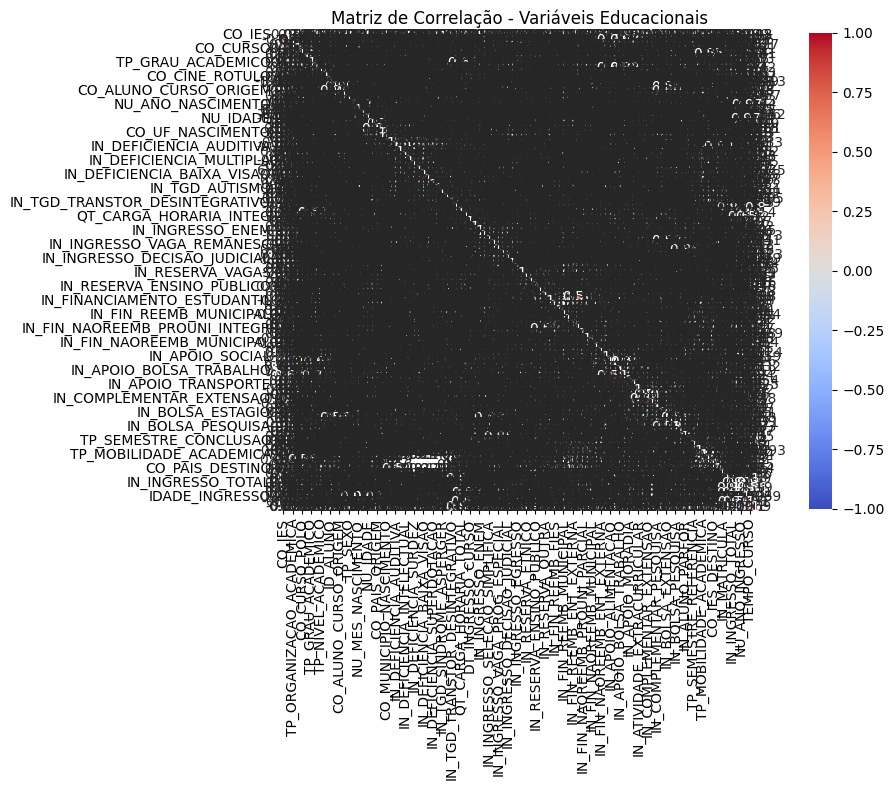


CORRELAÇÕES MAIS FORTES:
  NU_IDADE ↔ NU_ANO_NASCIMENTO: 1.000
  CONCLUIU ↔ IN_CONCLUINTE: 1.000
  CO_MUNICIPIO_NASCIMENTO ↔ CO_UF_NASCIMENTO: 1.000
  TEMPO_CURSO ↔ NU_ANO_INGRESSO: 0.999
  IDADE_INGRESSO ↔ NU_IDADE: 0.973
  IDADE_INGRESSO ↔ NU_ANO_NASCIMENTO: 0.973
  IN_INGRESSO_VAGA_NOVA ↔ IN_INGRESSO_TOTAL: 0.913
  CO_ALUNO_CURSO_ORIGEM ↔ CO_ALUNO_CURSO: 0.890
  IN_ALUNO_PARFOR ↔ IN_INGRESSO_VAGA_PROG_ESPECIAL: 0.849
  IN_CONCLUINTE ↔ TP_SITUACAO: 0.797


In [12]:
# Selecionar variáveis numéricas
numericas = df.select_dtypes(include=[np.number]).columns
numericas = [col for col in numericas if df[col].nunique() > 1]

# Matriz de correlação
corr_matrix = df[numericas].corr()

# Visualização
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, 
            square=True, linewidths=0.5)
plt.title('Matriz de Correlação - Variáveis Educacionais')
plt.tight_layout()
plt.savefig('matriz_correlacao.png', dpi=300, bbox_inches='tight')
plt.show()

# Top correlações
print("\nCORRELAÇÕES MAIS FORTES:")
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
correlacoes = upper_triangle.unstack().dropna()
correlacoes_abs = correlacoes.abs().sort_values(ascending=False)

for (var1, var2), corr in correlacoes_abs.head(10).items():
    print(f"  {var1} ↔ {var2}: {corr:.3f}")


AVALIAÇÃO DOS MODELOS (Target: Conclusão do Curso)
Features utilizadas: ['NU_IDADE', 'TEMPO_CURSO', 'TP_SEXO_ENCODED', 'TP_TURNO_ENCODED', 'TP_CATEGORIA_ADMINISTRATIVA_ENCODED']
Dados: 8430713 treino, 3613163 teste

Random Forest:
  CV Score: 0.895 ± 0.000
  Accuracy: 0.895
  F1-Score: 0.850

Logistic Regression:
  CV Score: 0.886 ± 0.000
  Accuracy: 0.886
  F1-Score: 0.844


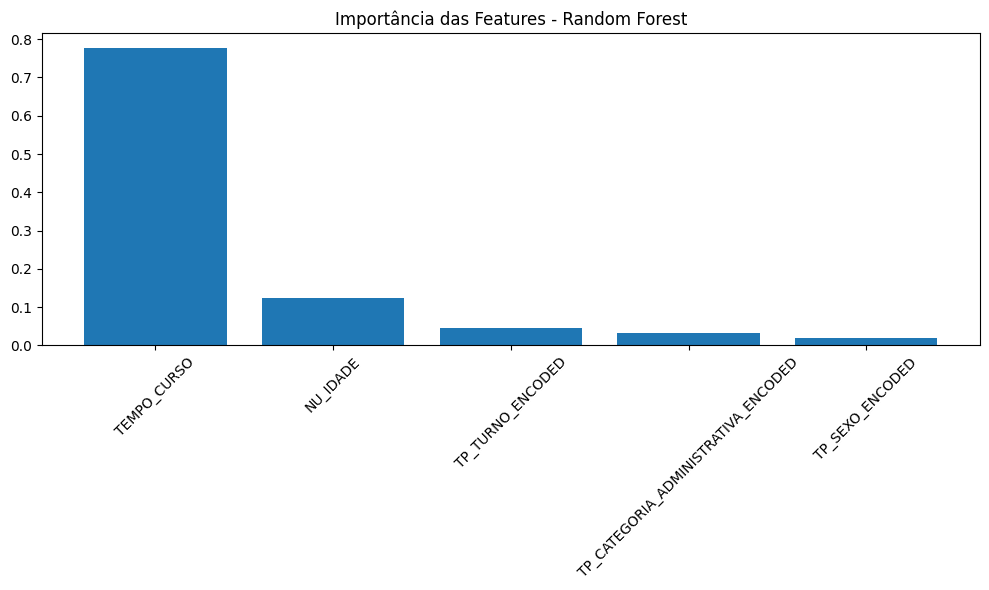

In [13]:
# Features para o modelo
features_numericas = ['NU_IDADE', 'TEMPO_CURSO']
features_numericas = [f for f in features_numericas if f in df.columns]

# Encoding de variáveis categóricas
le = LabelEncoder()
features_categoricas = []

for col in ['TP_SEXO', 'TP_TURNO', 'TP_CATEGORIA_ADMINISTRATIVA']:
    if col in df.columns:
        df[f'{col}_ENCODED'] = le.fit_transform(df[col].fillna(-1))
        features_categoricas.append(f'{col}_ENCODED')

# Dataset final
features = features_numericas + features_categoricas
features = [f for f in features if f in df.columns]


# Preparar X e y
X = df[features].fillna(df[features].mean())
y = df['CONCLUIU']

# Split treino/teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Modelos
modelos = {
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000)
}

print(f"\nAVALIAÇÃO DOS MODELOS (Target: Conclusão do Curso)")
print(f"Features utilizadas: {features}")
print(f"Dados: {X_train.shape[0]} treino, {X_test.shape[0]} teste")

resultados = {}

for nome, modelo in modelos.items():
    # Treinar
    modelo.fit(X_train, y_train)
    
    # Cross-validation
    cv_scores = cross_val_score(modelo, X_train, y_train, cv=5)
    
    # Predição
    y_pred = modelo.predict(X_test)
    
    # Métricas
    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    resultados[nome] = {
        'CV Score': cv_scores.mean(),
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1
    }
    
    print(f"\n{nome}:")
    print(f"  CV Score: {cv_scores.mean():.3f} ± {cv_scores.std():.3f}")
    print(f"  Accuracy: {accuracy:.3f}")
    print(f"  F1-Score: {f1:.3f}")

# Feature importance (Random Forest)
if 'Random Forest' in modelos:
    rf_model = modelos['Random Forest']
    importances = rf_model.feature_importances_
    
    plt.figure(figsize=(10, 6))
    indices = np.argsort(importances)[::-1]
    plt.bar(range(len(features)), importances[indices])
    plt.xticks(range(len(features)), [features[i] for i in indices], rotation=45)
    plt.title('Importância das Features - Random Forest')
    plt.tight_layout()
    plt.savefig('feature_importance.png', dpi=300, bbox_inches='tight')
    plt.show()

In [16]:
# Preparar dados para clustering
features_clustering = ['NU_IDADE', 'TEMPO_CURSO']
features_clustering = [f for f in features_clustering if f in df.columns]

# Dataset para clustering
X_cluster = df[features_clustering].dropna()
X_cluster_nodup = X_cluster.drop_duplicates()


# Padronizar dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster_nodup)

# Faixas de busca para hiperparâmetros
min_xi_values = np.arange(0.01, 0.1, 0.01)
min_cluster_size = np.arange(0.1, 0.6, 0.05)

best_score = -1
best_params = None
best_labels = None


for min_xi in min_xi_values:
    for min_cluster in min_cluster_size:
        optics = OPTICS(xi=min_xi, min_cluster_size=min_cluster)
        labels = optics.fit_predict(X_scaled)
        # Precisa de pelo menos 2 clusters (ignorando ruído)
        unique_clusters = set(labels) - {-1}
        if len(unique_clusters) < 2:
            continue
        
        try:
            score = silhouette_score(X_scaled, labels)
        except:
            continue
        
        if score > best_score:
            best_score = score
            best_params = (min_xi, min_cluster)
            xi_best, best_cluster = best_params
            best_labels = labels
            print(f"\nmin_xi: {min_xi}")
            print(f"\nmin_xi: {min_cluster}")
            print(f"qtd Cluster: {unique_clusters}")
            print(f"score: {score}")

# Resultado da busca
if best_params is None:
    print("\nNenhuma configuração viável encontrada para DBSCAN.")
else:
    print(f"Melhor min_xi: {xi_best}")
    print(f"Melhor min_samples: {best_cluster}")
    print(f"Silhouette Score: {best_score:.3f}")

    labels_nodup = best_labels
    labels_series = pd.Series(labels_nodup, index=X_cluster_nodup.index)

    df["CLUSTER_OPTICS"] = labels_series.reindex(df.index)
    best_k = df["CLUSTER_OPTICS"].nunique()

# Análise dos clusters
print(f"\nPERFIL DOS CLUSTERS:")
for cluster in range(best_k):
    mask = df["CLUSTER_OPTICS"] == cluster
    cluster_data = df[mask]
    
    print(f"\nCluster {cluster} (n={len(cluster_data)}):")
    
    if 'NU_IDADE' in df.columns:
        print(f"  Idade média: {cluster_data['NU_IDADE'].mean():.1f} anos")
    
    if 'TEMPO_CURSO' in df.columns:
        print(f"  Tempo no curso: {cluster_data['TEMPO_CURSO'].mean():.1f} anos")
    
    if 'CONCLUIU' in df.columns:
        taxa_conclusao = cluster_data['CONCLUIU'].mean() * 100
        print(f"  Taxa de conclusão: {taxa_conclusao:.1f}%")

# Visualização dos clusters
if len(features_clustering) >= 2:
    plt.figure(figsize=(12, 5))
    
    # Plot 1: Clusters no espaço original
    plt.subplot(1, 2, 1)
    scatter = plt.scatter(df[features_clustering[0]], df[features_clustering[1]], 
                        c=df["CLUSTER_OPTICS"], cmap='viridis', alpha=0.7)
    plt.xlabel(features_clustering[0])
    plt.ylabel(features_clustering[1])
    plt.title('Clusters - Espaço Original')
    plt.colorbar(scatter)
    
    # Plot 2: PCA
    if X_scaled.shape[1] > 2:
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        
        plt.subplot(1, 2, 2)
        scatter2 = plt.scatter(X_pca[:, 0], X_pca[:, 1], 
                                c=df["CLUSTER_OPTICS"], cmap='viridis', alpha=0.7)
        plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
        plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
        plt.title('Clusters - Espaço PCA')
        plt.colorbar(scatter2)
    
    plt.tight_layout()
    plt.savefig('clusters_analise.png', dpi=300, bbox_inches='tight')
    plt.show()



Nenhuma configuração viável encontrada para DBSCAN.

PERFIL DOS CLUSTERS:


NameError: name 'best_k' is not defined

In [ ]:
"""Analisa tendências temporais"""
print("\n" + "="*60)
print("ANÁLISE TEMPORAL E TENDÊNCIAS")
print("="*60)


# Análise por ano de ingresso
temporal_data = df.groupby('NU_ANO_INGRESSO').agg({
    'NU_IDADE': 'mean',
    'CONCLUIU': 'mean' if 'CONCLUIU' in df.columns else 'count',
    'ID_ALUNO': 'count'
}).round(2)

temporal_data.columns = ['Idade_Media', 'Taxa_Conclusao', 'Total_Ingressos']

print("\nTENDÊNCIAS POR ANO:")
print(temporal_data)

# Visualização temporal
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# 1. Ingressos por ano
axes[0,0].plot(temporal_data.index, temporal_data['Total_Ingressos'], marker='o')
axes[0,0].set_title('Ingressos por Ano')
axes[0,0].set_ylabel('Número de Ingressos')

# 2. Idade média por ano
axes[0,1].plot(temporal_data.index, temporal_data['Idade_Media'], marker='s', color='orange')
axes[0,1].set_title('Idade Média dos Ingressantes')
axes[0,1].set_ylabel('Idade (anos)')

# 3. Taxa de conclusão por ano
if 'CONCLUIU' in df.columns:
    axes[1,0].plot(temporal_data.index, temporal_data['Taxa_Conclusao']*100, marker='^', color='green')
    axes[1,0].set_title('Taxa de Conclusão por Ano')
    axes[1,0].set_ylabel('Taxa (%)')

# 4. Distribuição por sexo ao longo do tempo
if 'TP_SEXO_DESC' in df.columns:
    sexo_temporal = pd.crosstab(df['NU_ANO_INGRESSO'], df['TP_SEXO_DESC'], normalize='index')
    sexo_temporal.plot(kind='bar', stacked=True, ax=axes[1,1], alpha=0.8)
    axes[1,1].set_title('Distribuição por Sexo ao Longo do Tempo')
    axes[1,1].set_ylabel('Proporção')
    axes[1,1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig('analise_temporal.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
print("\n" + "="*80)
print("RELATÓRIO FINAL - INSIGHTS E CONCLUSÕES")
print("="*80)

insights = []

# 1. Demografia
if 'NU_IDADE' in df.columns:
    idade_media = df['NU_IDADE'].mean()
    insights.append(f"PERFIL DEMOGRÁFICO: Idade média de {idade_media:.1f} anos")

if 'TP_SEXO_DESC' in df.columns:
    dist_sexo = df['TP_SEXO_DESC'].value_counts(normalize=True)
    predominante = dist_sexo.index[0]
    pct = dist_sexo.iloc[0] * 100
    insights.append(f"   Predominância {predominante.lower()}: {pct:.1f}%")

# 2. Situação acadêmica
if 'TP_SITUACAO_DESC' in df.columns:
    situacao_principal = df['TP_SITUACAO_DESC'].value_counts().index[0]
    insights.append(f"SITUAÇÃO ACADÊMICA: Maioria em situação '{situacao_principal}'")

if 'CONCLUIU' in df.columns:
    taxa_conclusao = df['CONCLUIU'].mean() * 100
    insights.append(f"   Taxa geral de conclusão: {taxa_conclusao:.1f}%")

# 3. Clusters identificados
if 'CLUSTER' in df.columns:
    n_clusters = df['CLUSTER'].nunique()
    insights.append(f"SEGMENTAÇÃO: {n_clusters} perfis distintos identificados")
    
    # Cluster com maior taxa de conclusão
    if 'CONCLUIU' in df.columns:
        cluster_performance = df.groupby('CLUSTER')['CONCLUIU'].mean()
        melhor_cluster = cluster_performance.idxmax()
        melhor_taxa = cluster_performance.max() * 100
        insights.append(f"   Cluster {melhor_cluster} apresenta maior taxa de conclusão: {melhor_taxa:.1f}%")

# 4. Modelagem preditiva
if resultados:
    melhor_modelo = max(resultados.keys(), key=lambda k: resultados[k]['F1-Score'])
    melhor_f1 = resultados[melhor_modelo]['F1-Score']
    insights.append(f"PREDIÇÃO: {melhor_modelo} obteve melhor performance (F1: {melhor_f1:.3f})")

# 5. Tendências temporais
if temporal_data is not None and len(temporal_data) > 1:
    tendencia_ingressos = "crescente" if temporal_data['Total_Ingressos'].iloc[-1] > temporal_data['Total_Ingressos'].iloc[0] else "decrescente"
    insights.append(f"TENDÊNCIA TEMPORAL: Padrão {tendencia_ingressos} de ingressos")

# Imprimir insights
print("\nPRINCIPAIS INSIGHTS:")
for i, insight in enumerate(insights, 1):
    print(f"\n{i}. {insight}")

# Recomendações
print(f"\nRECOMENDAÇÕES ESTRATÉGICAS:")
print(f"\n1. RETENÇÃO: Focar nos clusters com menor taxa de conclusão")
print(f"2. CAPTAÇÃO: Considerar tendências demográficas identificadas")
print(f"3. MONITORAMENTO: Usar modelos preditivos para identificação precoce de risco")
print(f"4. PERSONALIZAÇÃO: Adaptar estratégias por perfil de cluster")